In [0]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np
from fastprogress import progress_bar as pb

In [0]:
import warnings
warnings.simplefilter('ignore')

In [0]:
FILEPATH_FMT = 's3://fin-app/stockprice_concat/{code}.csv'

In [0]:
df_stocklist = pd.read_csv('s3://fin-app/stocklist/stocklist.csv')

In [8]:
df_stocklist.head()

,銘柄コード,銘柄名,市場名,業種分類,単元株数,日経225採用銘柄
0,1301,(株)極洋,東証1部,水産・農林業,100,NaN
1,1332,日本水産(株),東証1部,水産・農林業,100,1.0
2,1333,マルハニチロ(株),東証1部,水産・農林業,100,1.0
3,1352,(株)ホウスイ,東証1部,卸売業,100,NaN
4,1376,カネコ種苗(株),東証1部,水産・農林業,100,NaN


In [0]:
codes = df_stocklist['銘柄コード'].unique()

In [12]:
codes

array([1301, 1332, 1333, ..., 9995, 9996, 9997])

In [15]:
df_dict = {}
skipped_code = []

for code in pb(codes):
    try:
        df_dict[code] = pd.read_csv(FILEPATH_FMT.format(code=code))
    except Exception:
        skipped_code.append(code)

In [16]:
skipped_code

[2980,
 2981,
 3229,
 4478,
 4481,
 4482,
 4483,
 4484,
 4485,
 4486,
 4487,
 4488,
 4881,
 6557,
 7078,
 7079,
 7080,
 7685,
 7686,
 8962,
 8965,
 8969,
 8970,
 8974,
 8978,
 8980,
 8983]

In [0]:
valid_codes = list(df_dict.keys())

In [17]:
df_dict[codes[0]].head()

,日付,始値,高値,安値,終値,出来高,終値調整値
0,1983-01-04,144,144,140,141,309000,1410
1,1983-01-05,144,155,142,153,2416000,1530
2,1983-01-06,162,168,157,160,7245000,1600
3,1983-01-07,160,162,155,155,1532000,1550
4,1983-01-08,157,158,152,152,340000,1520


In [0]:
for code, df in df_dict.items():
    df_dict[code] = df[['日付', '終値']]

In [0]:
 for code, df in df_dict.items():
    df_dict[code]['日付'] = pd.to_datetime(df_dict[code]['日付'])

In [152]:
df_dict[codes[0]].head()

,日付,終値
0,1983-01-04,141
1,1983-01-05,153
2,1983-01-06,160
3,1983-01-07,155
4,1983-01-08,152


In [0]:
from functools import reduce

In [43]:
# reduce(lambda v1, v2: (v1[0], pd.merge(v1[1], v2[1].rename(columns={'終値': v2[0]}), how='outer', on='日付')), pb(list(df_dict.items())))

TypeError: ignored

In [55]:
df_merged = None

for code, df in pb(df_dict.items()):
    # print(code)
    # print(df)
    if df_merged is None:
        df_merged = df.rename(columns={'終値': code})
    else:
        df_merged = pd.merge(df_merged, df.rename(columns={'終値': code}), how='outer', on='日付')

In [56]:
df_merged.head()

,日付,1301,1332,1333,1352,1376,1377,1379,1380,1381,1382,1383,1384,1400,1401,1407,1413,1414,1417,1418,1419,1420,1429,1430,1431,1433,1434,1435,1436,1438,1439,1443,1446,1447,1448,1449,1450,1451,1491,1514,...,9932,9934,9936,9941,9942,9943,9945,9946,9948,9950,9955,9956,9959,9960,9962,9964,9966,9967,9969,9972,9973,9974,9976,9977,9978,9979,9980,9982,9983,9984,9986,9987,9989,9990,9991,9993,9994,9995,9996,9997
0,1983-01-04,141.0,266.0,NaN,210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,328.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1983-01-05,153.0,267.0,NaN,210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,329.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1983-01-06,160.0,270.0,NaN,215.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,318.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1983-01-07,155.0,270.0,NaN,220.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,338.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1983-01-08,152.0,268.0,NaN,218.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,343.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
df_merged.tail()

,日付,1301,1332,1333,1352,1376,1377,1379,1380,1381,1382,1383,1384,1400,1401,1407,1413,1414,1417,1418,1419,1420,1429,1430,1431,1433,1434,1435,1436,1438,1439,1443,1446,1447,1448,1449,1450,1451,1491,1514,...,9932,9934,9936,9941,9942,9943,9945,9946,9948,9950,9955,9956,9959,9960,9962,9964,9966,9967,9969,9972,9973,9974,9976,9977,9978,9979,9980,9982,9983,9984,9986,9987,9989,9990,9991,9993,9994,9995,9996,9997
9287,2019-12-12,2863.0,631.0,NaN,878.0,1499.0,3520.0,1988.0,812.0,2440.0,1223.0,2500.0,679.0,289.0,1040.0,1635.0,NaN,4530.0,1665.0,250.0,1682.0,688.0,628.0,635.0,NaN,1230.0,380.0,226.0,661.0,1550.0,1330.0,428.0,839.0,387.0,519.0,639.0,2559.0,785.0,19.0,152.0,...,2045.0,2817.0,6480.0,543.0,1001.0,1643.0,1935.0,1437.0,2271.0,3085.0,1674.0,2061.0,599.0,2550.0,2720.0,1697.0,790.0,1685.0,221.0,231.0,22.0,5110.0,NaN,NaN,159.0,1606.0,206.0,1937.0,64450.0,4334.0,1459.0,4650.0,3940.0,909.0,1136.0,1681.0,2272.0,455.0,1715.0,698.0
9288,2019-12-13,2852.0,652.0,NaN,883.0,1474.0,3545.0,1993.0,817.0,2426.0,1225.0,2509.0,680.0,285.0,991.0,1647.0,NaN,4575.0,1681.0,251.0,1638.0,683.0,645.0,637.0,NaN,1214.0,390.0,224.0,640.0,1545.0,1310.0,406.0,813.0,385.0,523.0,650.0,2594.0,788.0,20.0,152.0,...,2064.0,2830.0,6460.0,540.0,1001.0,1628.0,1938.0,1444.0,2291.0,3095.0,1655.0,2070.0,598.0,2582.0,2754.0,1688.0,794.0,1675.0,219.0,230.0,23.0,5320.0,1214.0,2680.0,159.0,1615.0,217.0,1968.0,67280.0,4388.0,1473.0,4640.0,3945.0,911.0,1140.0,1700.0,2264.0,458.0,1682.0,705.0
9289,1984-09-01,NaN,322.0,NaN,280.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,403.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9290,1984-10-26,NaN,317.0,NaN,258.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,426.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9291,1987-10-22,NaN,595.0,NaN,1590.0,1650.0,7180.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,566.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
df_merged['日付'] = pd.to_datetime(df_merged['日付'])

In [0]:
df_merged = df_merged.set_index('日付')

In [62]:
df_merged.head()

,1301,1332,1333,1352,1376,1377,1379,1380,1381,1382,1383,1384,1400,1401,1407,1413,1414,1417,1418,1419,1420,1429,1430,1431,1433,1434,1435,1436,1438,1439,1443,1446,1447,1448,1449,1450,1451,1491,1514,1515,...,9932,9934,9936,9941,9942,9943,9945,9946,9948,9950,9955,9956,9959,9960,9962,9964,9966,9967,9969,9972,9973,9974,9976,9977,9978,9979,9980,9982,9983,9984,9986,9987,9989,9990,9991,9993,9994,9995,9996,9997
日付,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1983-01-04,141.0,266.0,NaN,210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,328.0,NaN,384.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983-01-05,153.0,267.0,NaN,210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,329.0,NaN,375.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983-01-06,160.0,270.0,NaN,215.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,318.0,NaN,373.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983-01-07,155.0,270.0,NaN,220.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,338.0,NaN,385.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1983-01-08,152.0,268.0,NaN,218.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,343.0,NaN,393.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
df_corr = df_merged.corr()

In [65]:
df_corr

,1301,1332,1333,1352,1376,1377,1379,1380,1381,1382,1383,1384,1400,1401,1407,1413,1414,1417,1418,1419,1420,1429,1430,1431,1433,1434,1435,1436,1438,1439,1443,1446,1447,1448,1449,1450,1451,1491,1514,1515,...,9932,9934,9936,9941,9942,9943,9945,9946,9948,9950,9955,9956,9959,9960,9962,9964,9966,9967,9969,9972,9973,9974,9976,9977,9978,9979,9980,9982,9983,9984,9986,9987,9989,9990,9991,9993,9994,9995,9996,9997
1301,1.000000,0.522941,0.885606,0.480975,0.580336,0.492713,-0.155962,0.460887,0.858152,-0.423501,0.637165,0.329793,-0.173348,-0.301533,0.001604,-0.176111,0.767685,0.771995,0.542474,0.398319,0.545112,-0.470016,-0.468528,0.474160,-0.672736,0.184574,-0.507580,0.143542,0.391742,0.352459,0.277727,0.481516,0.734499,0.547345,-0.570024,-0.236799,0.675087,0.042347,0.483497,0.974489,...,0.579898,0.629774,0.782327,0.342184,0.012425,0.266236,-0.012576,0.011908,0.671731,0.978331,-0.004527,0.371602,-0.066026,0.859194,-0.115758,0.457501,-0.339150,0.818076,-0.563877,-0.199165,-0.383942,0.839485,0.166030,0.703273,-0.109080,0.568791,-0.092291,0.821131,0.634730,0.019558,0.723786,0.587202,0.128217,0.178241,0.449850,0.243301,0.717555,-0.020897,0.501542,-0.211243
1332,0.522941,1.000000,0.819215,0.716162,0.704222,0.631369,-0.308227,0.522763,0.752667,0.053173,0.465893,0.093081,0.084000,-0.343294,-0.316119,-0.180745,0.692783,0.778733,0.452732,0.099929,0.132087,-0.661098,-0.676283,0.264912,-0.643274,-0.265283,-0.298803,-0.192047,0.237036,-0.496271,-0.284777,-0.230909,0.429459,0.290267,0.404882,0.587432,-0.099601,0.577493,0.341916,0.532843,...,0.874792,0.847072,0.578312,0.447404,0.077469,0.668132,0.238647,0.103905,0.466387,0.578499,0.009215,0.419797,-0.184528,0.727388,-0.275865,0.624701,-0.074332,0.582447,-0.191258,-0.294687,-0.180964,0.869648,0.279869,0.656142,0.056670,0.809117,-0.034225,0.503613,0.404747,-0.124253,0.721696,0.717077,0.083573,0.087482,0.570869,0.545463,0.450833,0.190999,0.659775,-0.210135
1333,0.885606,0.819215,1.000000,0.718559,0.878108,0.931524,-0.366613,0.812763,0.752473,-0.754594,0.462193,0.343555,0.679311,-0.152891,-0.383670,0.782329,0.803001,0.617654,0.264702,0.640604,0.637348,-0.545937,-0.547955,0.428803,-0.776070,0.149614,-0.621848,-0.141864,0.454608,-0.424148,-0.129354,-0.162981,0.627239,0.700593,0.832742,-0.130223,NaN,-0.456148,0.303447,0.827944,...,0.862311,0.680655,0.712153,0.694474,0.875317,0.896814,-0.188589,0.482369,0.664922,0.890643,-0.007895,0.385985,-0.666307,0.935466,-0.102734,0.636538,-0.511522,0.742376,-0.593770,0.516436,-0.630447,0.845750,0.718247,0.690422,0.349976,0.844949,0.476696,0.749865,0.274905,0.624542,0.668137,0.601957,-0.241026,-0.782598,-0.253883,0.664102,0.533198,0.053591,0.857220,0.860658
1352,0.480975,0.716162,0.718559,1.000000,0.728446,0.742970,-0.164174,0.520276,0.767439,-0.240232,0.752382,0.281848,-0.048198,-0.474676,0.021214,-0.263311,0.721077,0.795757,0.397886,0.578850,0.695705,-0.320872,-0.277429,0.507431,-0.585986,0.227423,-0.531795,-0.253282,0.443997,-0.393176,0.289654,0.382778,0.843516,0.704691,0.136612,0.386257,0.104861,0.684709,0.610370,0.467946,...,0.614513,0.601229,0.698597,0.516875,0.176099,0.225461,0.010334,0.176032,0.521430,0.746895,0.163237,0.321428,-0.044173,0.826683,-0.066429,0.579636,-0.285067,0.979001,-0.499314,-0.124404,-0.175391,0.722441,0.340885,0.669493,0.063202,0.510726,0.043099,0.946525,0.557734,0.010469,0.615275,0.660773,0.003752,0.109742,0.476995,0.263917,0.720003,0.167503,0.621248,-0.138805
1376,0.580336,0.704222,0.878108,0.728446,1.000000,0.882083,-0.103196,0.310302,0.901491,-0.591773,0.493665,0.470674,-0.248946,-0.126300,0.057558,-0.295214,0.871835,0.825856,0.689782,0.101444,0.370988,-0.653443,-0.326461,0.256015,-0.435591,0.367212,-0.307312,0.294102,0.188182,0.491452,0.485964,0.154604,0.601927,0.345296,0.131864,0.299387,0.263874,0.648858,0.533771,0.574291,...,0.523140,0.686739,0.786101,0.597203,0.321472,0.091627,-0.069257,0.357801,0.872595,0.774462,0.334601,0.479758,0.177039,0.832520,-0.019671,0.474045,-0.408744,0.670380,-0.668645,-0.153513,-0.250625,0.945456,0.503783,0.620

In [0]:
df_corr.to_csv('stockprice_corr.csv')

In [0]:
import seaborn as sns

In [0]:
df_corr = df_corr.fillna(0)

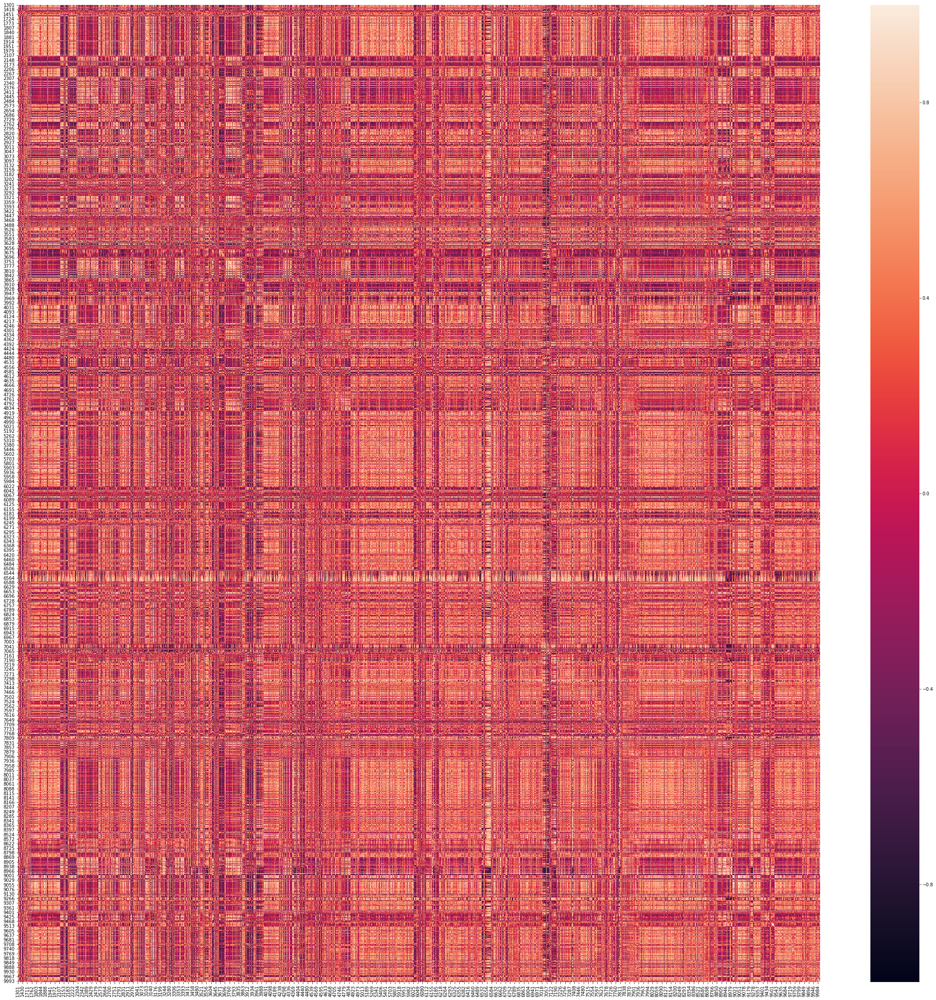

In [72]:
plt.figure(figsize=(40, 40))
sns.heatmap(df_corr)

In [0]:
corr = np.array(df_corr)

In [101]:
np.argmax(corr)

2440314

In [102]:
np.unravel_index(np.argmax(corr), corr.shape)

(635, 2549)

In [103]:
corr[635, 2549]

1.0000000000000002

In [88]:
valid_codes[635]

3137

In [89]:
valid_codes[2549]

7077

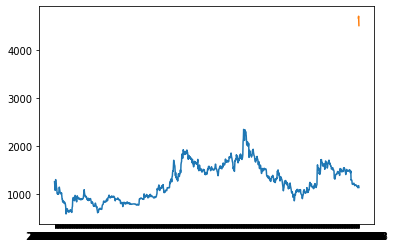

In [93]:
plt.plot(df_dict[valid_codes[635]]['日付'], df_dict[valid_codes[635]]['終値'])
plt.plot(df_dict[valid_codes[2549]]['日付'], df_dict[valid_codes[2549]]['終値'])

In [92]:
df_dict[valid_codes[635]]

,日付,終値
0,2015-06-25,1254
1,2015-06-26,1158
2,2015-06-29,1072
3,2015-06-30,1081
4,2015-07-01,1297
...,...,...
1084,2019-12-09,1129
1085,2019-12-10,1149
1086,2019-12-11,1164
1087,2019-12-12,1171


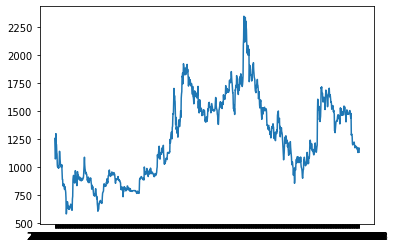

In [94]:
plt.plot(df_dict[valid_codes[635]]['日付'], df_dict[valid_codes[635]]['終値'])

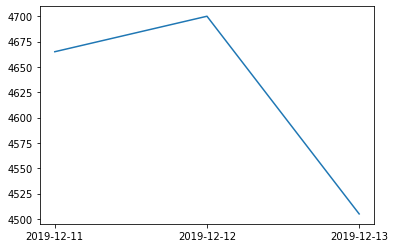

In [95]:
plt.plot(df_dict[valid_codes[2549]]['日付'], df_dict[valid_codes[2549]]['終値'])

In [97]:
df_dict[valid_codes[2549]]

,日付,終値
0,2019-12-11,4665
1,2019-12-12,4700
2,2019-12-13,4505


In [0]:
sorted_args = np.dstack(np.unravel_index(np.argsort(corr.ravel()), corr.shape))[0][::-1]

In [115]:
len(sorted_args)

14737921

corr : 0.9499986800671931
3004, 3431


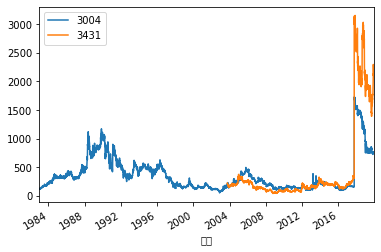

corr : 0.9499986800671931
3431, 3004


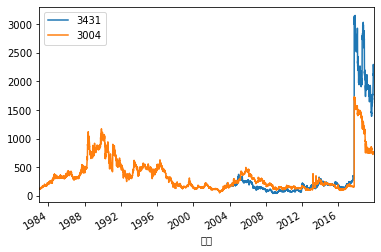

corr : 0.9499972650598904
3526, 4119


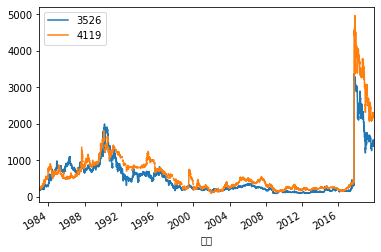

corr : 0.9499972650598904
4119, 3526


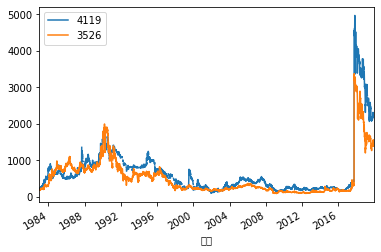

corr : 0.9499970072461094
6381, 3950


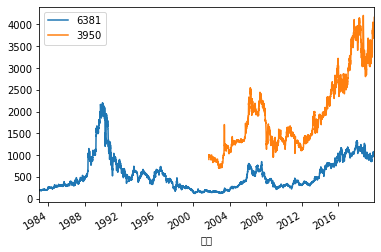

corr : 0.9499970072461094
3950, 6381


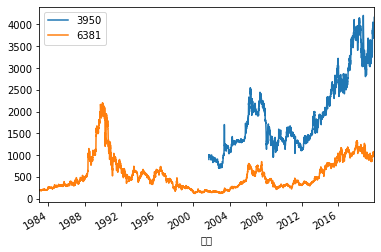

corr : 0.9499962121394356
9974, 8182


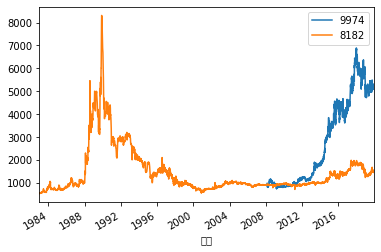

corr : 0.9499962121394356
8182, 9974


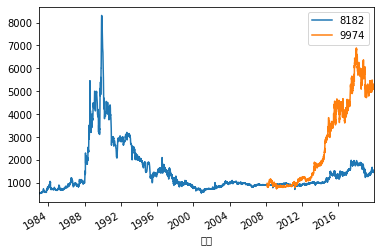

corr : 0.9499961247303609
4985, 2816


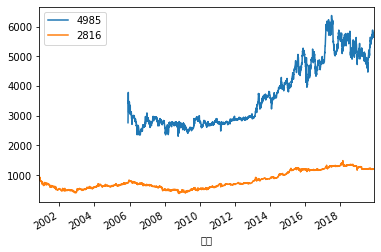

corr : 0.9499961247303609
2816, 4985


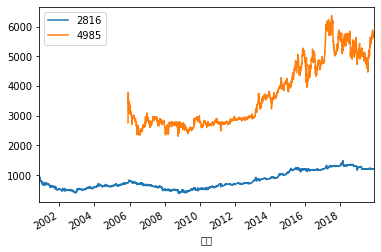

corr : 0.9499946699813222
9072, 6367


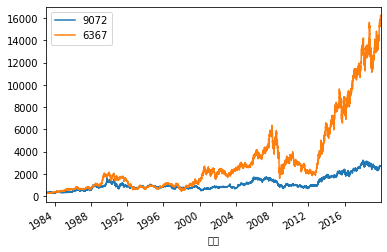

corr : 0.9499946699813222
6367, 9072


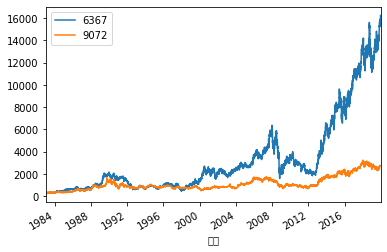

corr : 0.9499941011570436
2294, 9974


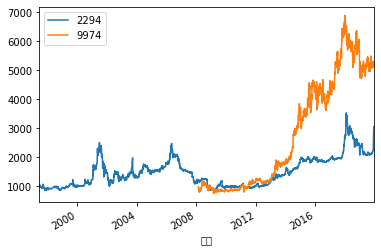

corr : 0.9499941011570436
9974, 2294


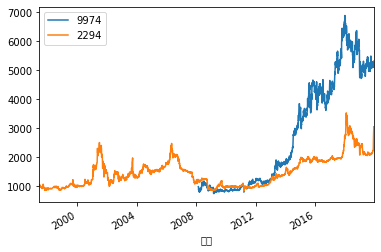

corr : 0.9499934701750906
3744, 1711


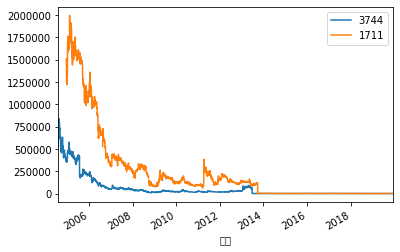

corr : 0.9499934701750906
1711, 3744


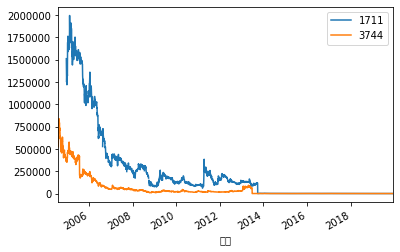

corr : 0.949993357969971
9929, 3202


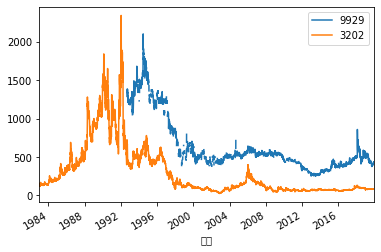

corr : 0.949993357969971
3202, 9929


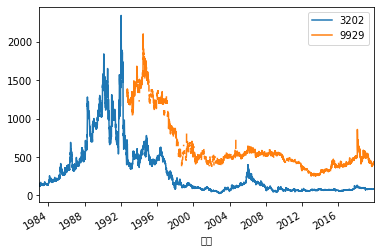

corr : 0.9499920223837236
7734, 7525


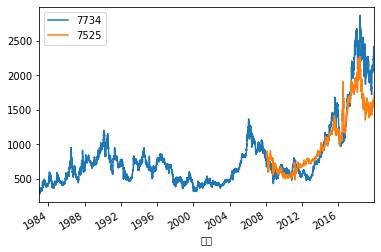

corr : 0.9499920223837236
7525, 7734


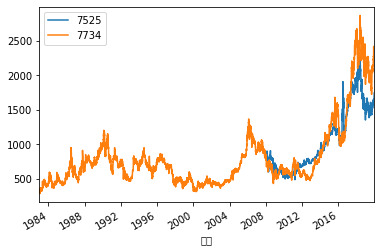

corr : 0.9499911888459375
6396, 8059


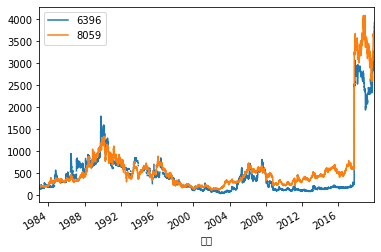

corr : 0.9499911888459375
8059, 6396


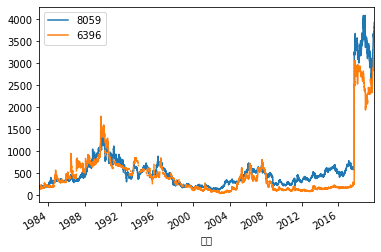

corr : 0.9499909321614034
9048, 3431


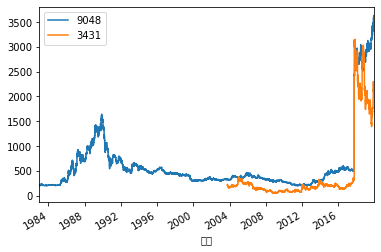

corr : 0.9499909321614034
3431, 9048


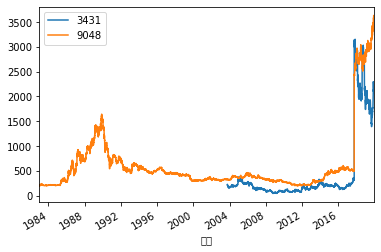

corr : 0.9499896963042326
8089, 8981


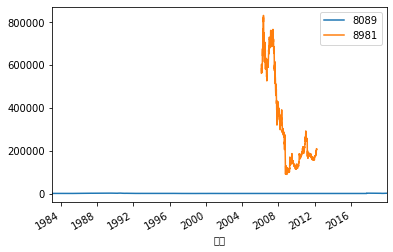

corr : 0.9499896963042326
8981, 8089


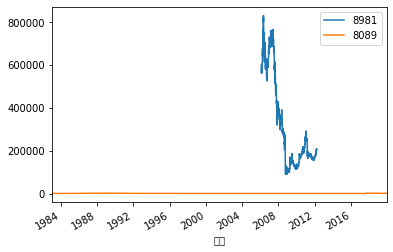

corr : 0.9499873847114678
6659, 4771


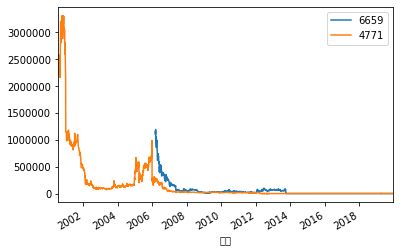

corr : 0.9499873847114678
4771, 6659


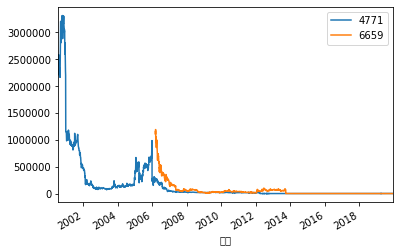

corr : 0.9499867023870875
7413, 5695


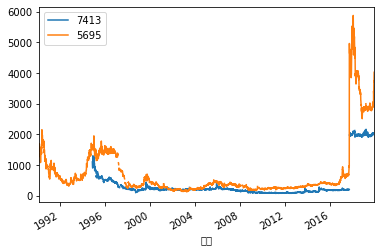

corr : 0.9499867023870875
5695, 7413


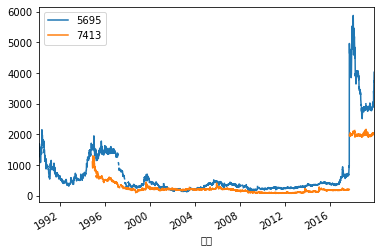

corr : 0.9499856424737555
2136, 8912


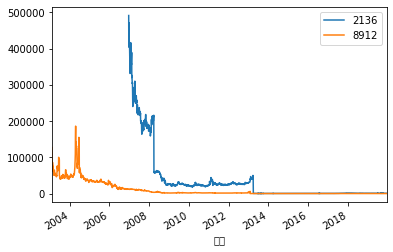

corr : 0.9499856424737555
8912, 2136


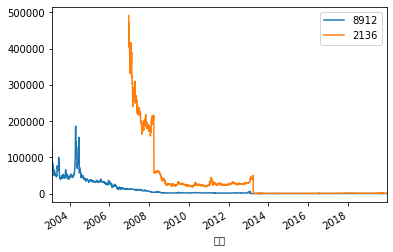

corr : 0.9499830971475408
6439, 2872


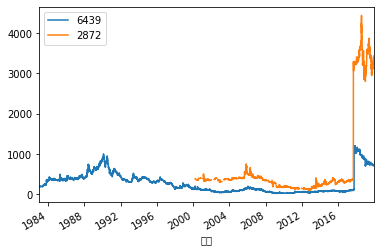

corr : 0.9499830971475408
2872, 6439


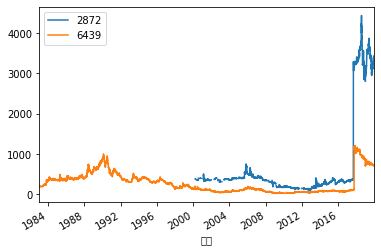

corr : 0.949982413499784
9407, 3408


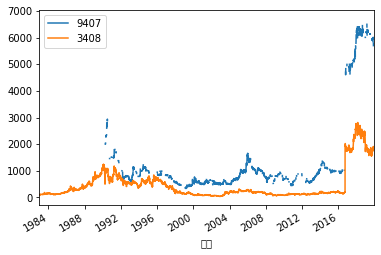

corr : 0.949982413499784
3408, 9407


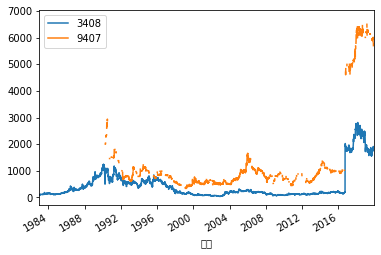

corr : 0.9499817288375519
3744, 3319


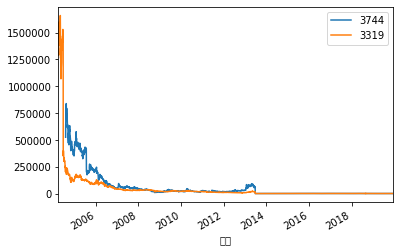

corr : 0.9499817288375519
3319, 3744


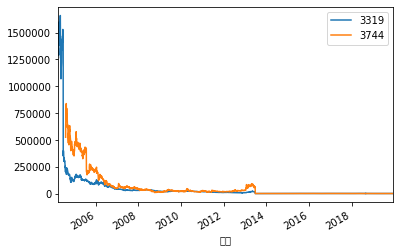

corr : 0.9499811851280424
8392, 8088


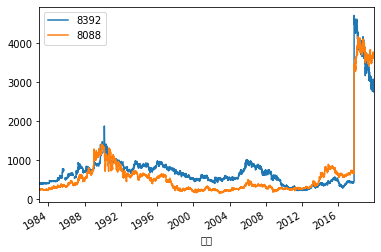

corr : 0.9499811851280424
8088, 8392


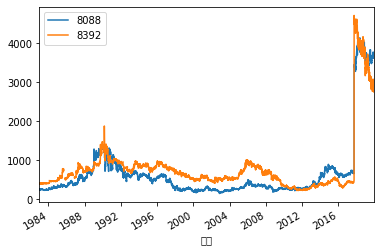

corr : 0.9499811772951053
4386, 6164


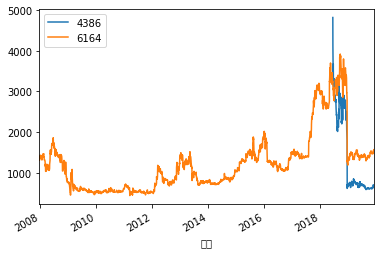

corr : 0.9499811772951053
6164, 4386


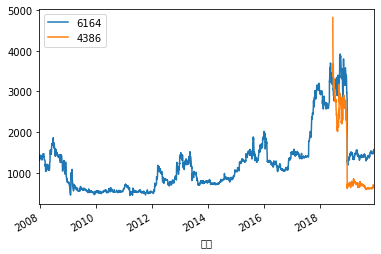

corr : 0.9499798380239949
8006, 7273


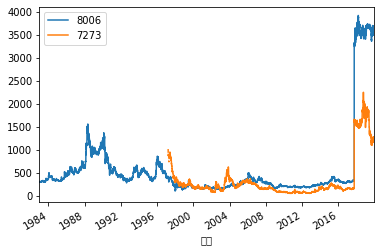

corr : 0.9499798380239949
7273, 8006


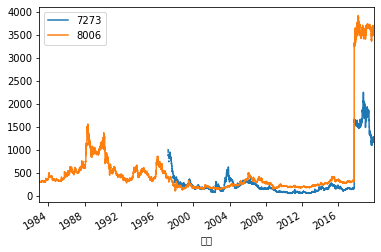

corr : 0.9499775911967068
9027, 8030


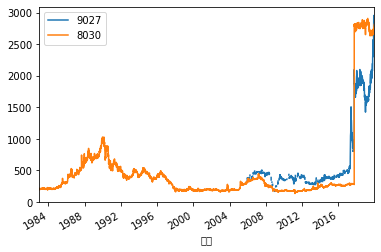

corr : 0.9499775911967068
8030, 9027


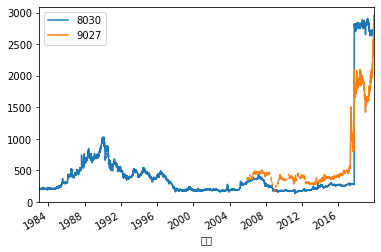

corr : 0.9499747448695544
9041, 1801


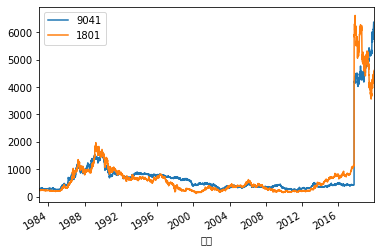

corr : 0.9499747448695544
1801, 9041


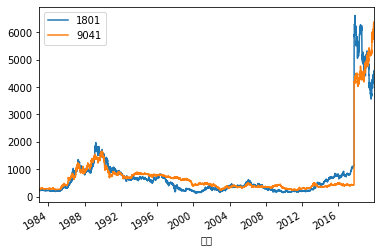

corr : 0.9499744023407349
9795, 9687


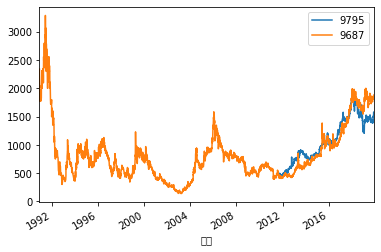

corr : 0.9499744023407349
9687, 9795


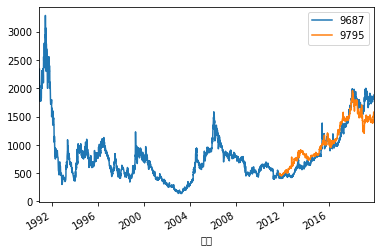

corr : 0.9499743598998649
7273, 7464


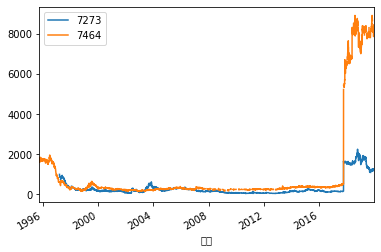

In [168]:
cnt = 0

for arg in sorted_args[:200000]:
    if arg[0] == arg[1]:
        continue
    if len(df_dict[valid_codes[arg[0]]]) < 50 or len(df_dict[valid_codes[arg[1]]]) < 50:
        #print('Data point is insufficient. Skipping.')
        continue
    if corr[arg[0], arg[1]] >= 0.95:
        continue
    
    cnt += 1
    merged_pair = pd.merge(
        df_dict[valid_codes[arg[0]]].set_index('日付').rename(columns={'終値': valid_codes[arg[0]]}),
        df_dict[valid_codes[arg[1]]].set_index('日付').rename(columns={'終値': valid_codes[arg[1]]}),
        how='outer', on='日付'
    )
    print(f'corr : {corr[arg[0], arg[1]]}')
    print(f'{valid_codes[arg[0]]}, {valid_codes[arg[1]]}')
    merged_pair.plot()
    plt.show()
    print('='*100)

    if cnt > 50:
        break